##### ARTI 560 - Computer Vision

## Instance Segmentation - Exercise 

### Objective

In this exercise, you will implement **Instance Object Segmentation** using a pretrained **Mask R-CNN model** from TensorFlow Hub.

You will follow these steps:

1. **Load the pretrained Mask R-CNN model**  
   - Use this Kaggle link: [Mask R-CNN Inception-ResNet-v2](https://www.kaggle.com/models/tensorflow/mask-rcnn-inception-resnet-v2)  

2. **Select and load 5 different images**  
   - Choose **5 diverse images**, including:  
      - Crowded scenes with multiple objects  
      - Unusual angles, lighting conditions, or occlusions  
      - At least **one image containing multiple objects of the same class** 

3. **Perform inference using the model**  
   - Feed images to the model to obtain predictions  

4. **Extract prediction outputs**  
   - **Bounding boxes** – coordinates of detected objects  
   - **Class labels** – names of detected objects  
   - **Segmentation masks** – pixel-wise masks for each object  

5. **Visualize the results**  
   - Overlay masks on detected objects  
   - Draw bounding boxes around objects  
   - Display class names and confidence scores  

6. **Experiment with confidence thresholds**  
   - Default threshold: **0.5**  
   - Lower threshold: **0.3** to detect more objects (may include false positives)  

---

- Keep in mind:  
  - Some objects may not be recognized at the default threshold 
  - The model only detects objects from the **COCO dataset (80 classes)**  


# Install and import

In [47]:
! pip install -q tensorflow-hub

In [48]:
from PIL import ImageDraw, ImageFont

In [49]:

! pip install -q tensorflow tensorflow_hub kagglehub pillow matplotlib numpy

import os
import time
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from urllib.request import urlopen
from io import BytesIO

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel("ERROR")

In [50]:
import tensorflow_hub as hub

In [51]:
import os
import tensorflow as tf
import tensorflow_hub as hub

USE_LOCAL_KAGGLE_MODEL = False
MODEL_DIR = "/kaggle/input/mask-rcnn-inception-resnet-v2/TensorFlow2/1024x1024/1"
TFHUB_HANDLE = "https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1"


def get_inference_fn(model_obj):
    signature_keys = list(model_obj.signatures.keys())
    print("Available signatures:", signature_keys)

    if "serving_default" in model_obj.signatures:
        return model_obj.signatures["serving_default"]

    if "default" in model_obj.signatures:
        return model_obj.signatures["default"]

    if signature_keys:
        return model_obj.signatures[signature_keys[0]]

    if callable(model_obj):
        return model_obj

    raise ValueError("No callable inference function or signatures found.")


def load_detector():
    if USE_LOCAL_KAGGLE_MODEL and os.path.exists(MODEL_DIR):
        model = tf.saved_model.load(MODEL_DIR)
        return get_inference_fn(model)

    model = hub.load(TFHUB_HANDLE)
    return get_inference_fn(model)


detector = load_detector()
print("Model loaded successfully.")

Available signatures: ['serving_default']
Model loaded successfully.


In [52]:
IMAGE_URLS = {
    "crowded_scene_multiple_people": "http://images.cocodataset.org/val2017/000000001000.jpg",
    "sports_scene_multiple_people": "http://images.cocodataset.org/val2017/000000000872.jpg",
    "unusual_snow_scene": "http://images.cocodataset.org/val2017/000000000785.jpg",
    "single_large_animal": "http://images.cocodataset.org/val2017/000000000285.jpg",
    "traffic_sign_scene": "http://images.cocodataset.org/val2017/000000000724.jpg",
}

In [53]:
COCO_LABEL_MAP = {
    1: "person", 2: "bicycle", 3: "car", 4: "motorcycle", 5: "airplane",
    6: "bus", 7: "train", 8: "truck", 9: "boat", 10: "traffic light",
    11: "fire hydrant", 13: "stop sign", 14: "parking meter", 15: "bench",
    16: "bird", 17: "cat", 18: "dog", 19: "horse", 20: "sheep", 21: "cow",
    22: "elephant", 23: "bear", 24: "zebra", 25: "giraffe", 27: "backpack",
    28: "umbrella", 31: "handbag", 32: "tie", 33: "suitcase", 34: "frisbee",
    35: "skis", 36: "snowboard", 37: "sports ball", 38: "kite", 39: "baseball bat",
    40: "baseball glove", 41: "skateboard", 42: "surfboard", 43: "tennis racket",
    44: "bottle", 46: "wine glass", 47: "cup", 48: "fork", 49: "knife",
    50: "spoon", 51: "bowl", 52: "banana", 53: "apple", 54: "sandwich",
    55: "orange", 56: "broccoli", 57: "carrot", 58: "hot dog", 59: "pizza",
    60: "donut", 61: "cake", 62: "chair", 63: "couch", 64: "potted plant",
    65: "bed", 67: "dining table", 70: "toilet", 72: "tv", 73: "laptop",
    74: "mouse", 75: "remote", 76: "keyboard", 77: "cell phone", 78: "microwave",
    79: "oven", 80: "toaster", 81: "sink", 82: "refrigerator", 84: "book",
    85: "clock", 86: "vase", 87: "scissors", 88: "teddy bear", 89: "hair drier",
    90: "toothbrush"
}

In [54]:


# =========================================================
# 5) Utilities
# =========================================================
def load_image_from_url(url: str) -> np.ndarray:
    with urlopen(url) as response:
        image_data = response.read()
    image = Image.open(BytesIO(image_data)).convert("RGB")
    return np.array(image)


def run_inference(detector_fn, image_np: np.ndarray) -> dict:
    input_tensor = tf.convert_to_tensor(image_np, dtype=tf.uint8)[tf.newaxis, ...]
    outputs = detector_fn(input_tensor)
    outputs = {k: v.numpy() for k, v in outputs.items()}
    return outputs


def random_color(seed: int) -> tuple:
    rng = random.Random(seed)
    return (
        rng.randint(64, 255),
        rng.randint(64, 255),
        rng.randint(64, 255),
    )


def draw_box(draw, box, width, height, color, thickness=3):
    ymin, xmin, ymax, xmax = box
    left = int(xmin * width)
    right = int(xmax * width)
    top = int(ymin * height)
    bottom = int(ymax * height)

    for t in range(thickness):
        draw.rectangle(
            [(left - t, top - t), (right + t, bottom + t)],
            outline=color
        )

    return left, top, right, bottom


def paste_instance_mask(base_image, mask, box, color, alpha=90, mask_threshold=0.5):
    """
    mask: [mask_h, mask_w] or [mask_h, mask_w, 1]
    box: normalized [ymin, xmin, ymax, xmax]
    """
    if mask.ndim == 3:
        mask = mask[..., 0]

    height, width = base_image.size[1], base_image.size[0]
    ymin, xmin, ymax, xmax = box

    left = max(0, int(xmin * width))
    top = max(0, int(ymin * height))
    right = min(width, int(xmax * width))
    bottom = min(height, int(ymax * height))

    if right <= left or bottom <= top:
        return

    box_w = right - left
    box_h = bottom - top

    mask_img = Image.fromarray((mask * 255).astype(np.uint8))
    mask_img = mask_img.resize((box_w, box_h), Image.Resampling.BILINEAR)
    mask_np = np.array(mask_img).astype(np.float32) / 255.0
    binary_mask = mask_np >= mask_threshold

    overlay = Image.new("RGBA", (width, height), (0, 0, 0, 0))
    overlay_np = np.array(overlay)

    overlay_np[top:bottom, left:right, 0] = color[0]
    overlay_np[top:bottom, left:right, 1] = color[1]
    overlay_np[top:bottom, left:right, 2] = color[2]
    overlay_np[top:bottom, left:right, 3] = binary_mask.astype(np.uint8) * alpha

    overlay = Image.fromarray(overlay_np, mode="RGBA")
    composed = Image.alpha_composite(base_image.convert("RGBA"), overlay)
    base_image.paste(composed.convert("RGB"))


def get_num_detections(outputs: dict) -> int:
    if "num_detections" in outputs:
        return int(outputs["num_detections"][0])
    if "detection_scores" in outputs:
        return int(outputs["detection_scores"].shape[1])
    raise ValueError("Could not determine number of detections from model outputs.")


def summarize_output_keys(outputs: dict):
    print("Available output keys:")
    for k, v in outputs.items():
        print(f"  {k}: shape={v.shape}")


def visualize_detections(
    image_np: np.ndarray,
    outputs: dict,
    threshold: float = 0.5,
    max_detections: int = 20,
    title: str = ""
):
    image_pil = Image.fromarray(image_np.copy()).convert("RGB")
    draw = ImageDraw.Draw(image_pil)

    try:
        font = ImageFont.truetype("arial.ttf", 18)
    except Exception:
        font = ImageFont.load_default()

    num = get_num_detections(outputs)

    boxes = outputs["detection_boxes"][0][:num]
    classes = outputs["detection_classes"][0][:num].astype(np.int32)
    scores = outputs["detection_scores"][0][:num]

    masks = outputs.get("detection_masks", None)
    if masks is not None:
        masks = masks[0][:num]

    kept = 0
    width, height = image_pil.size

    for i in range(min(num, max_detections)):
        score = float(scores[i])
        if score < threshold:
            continue

        cls_id = int(classes[i])
        label = COCO_LABEL_MAP.get(cls_id, f"class_{cls_id}")
        color = random_color(cls_id * 1000 + i)

        if masks is not None:
            paste_instance_mask(image_pil, masks[i], boxes[i], color=color, alpha=100, mask_threshold=0.5)

        left, top, right, bottom = draw_box(draw, boxes[i], width, height, color=color, thickness=3)

        text = f"{label}: {score:.2f}"
        text_bbox = draw.textbbox((left, top), text, font=font)
        tx0, ty0, tx1, ty1 = text_bbox
        text_bg_top = max(0, ty0 - 2)
        draw.rectangle([(tx0, text_bg_top), (tx1 + 4, ty1 + 2)], fill=color)
        draw.text((left + 2, text_bg_top), text, fill="black", font=font)

        kept += 1

    plt.figure(figsize=(12, 9))
    plt.imshow(image_pil)
    plt.title(f"{title}\nthreshold={threshold} | shown={kept}")
    plt.axis("off")
    plt.show()


def print_detection_table(outputs: dict, threshold: float = 0.5, max_rows: int = 20):
    num = get_num_detections(outputs)
    boxes = outputs["detection_boxes"][0][:num]
    classes = outputs["detection_classes"][0][:num].astype(np.int32)
    scores = outputs["detection_scores"][0][:num]

    print(f"\nDetections at threshold {threshold}:")
    print("-" * 110)
    print(f"{'idx':<5}{'class_id':<10}{'label':<20}{'score':<10}{'box [ymin, xmin, ymax, xmax]'}")
    print("-" * 110)

    shown = 0
    for i in range(num):
        if float(scores[i]) < threshold:
            continue
        cls_id = int(classes[i])
        label = COCO_LABEL_MAP.get(cls_id, f"class_{cls_id}")
        box = np.round(boxes[i], 3).tolist()
        print(f"{i:<5}{cls_id:<10}{label:<20}{float(scores[i]):<10.3f}{box}")
        shown += 1
        if shown >= max_rows:
            break

    if shown == 0:
        print("No detections above threshold.")


In [55]:
from urllib.request import urlopen
from io import BytesIO
from PIL import Image
import numpy as np
import time

In [56]:

# =========================================================
# 6) Run on 5 images
# =========================================================
results = {}

for name, url in IMAGE_URLS.items():
    print(f"\n{'=' * 80}")
    print(f"Processing: {name}")
    print(url)

    image_np = load_image_from_url(url)

    start = time.time()
    outputs = run_inference(detector, image_np)
    elapsed = time.time() - start

    results[name] = {
        "url": url,
        "image": image_np,
        "outputs": outputs,
        "time_sec": elapsed,
    }

    print(f"Inference time: {elapsed:.2f} sec")

# Optional: inspect output keys once
first_key = next(iter(results))
summarize_output_keys(results[first_key]["outputs"])



Processing: crowded_scene_multiple_people
http://images.cocodataset.org/val2017/000000001000.jpg
Inference time: 8.31 sec

Processing: sports_scene_multiple_people
http://images.cocodataset.org/val2017/000000000872.jpg
Inference time: 6.64 sec

Processing: unusual_snow_scene
http://images.cocodataset.org/val2017/000000000785.jpg
Inference time: 6.71 sec

Processing: single_large_animal
http://images.cocodataset.org/val2017/000000000285.jpg
Inference time: 6.72 sec

Processing: traffic_sign_scene
http://images.cocodataset.org/val2017/000000000724.jpg
Inference time: 6.80 sec
Available output keys:
  rpn_features_to_crop: shape=(1, 64, 64, 1088)
  detection_multiclass_scores: shape=(1, 100, 91)
  num_detections: shape=(1,)
  proposal_boxes_normalized: shape=(1, 300, 4)
  rpn_box_predictor_features: shape=(1, 64, 64, 512)
  mask_predictions: shape=(100, 90, 33, 33)
  raw_detection_boxes: shape=(1, 300, 4)
  detection_classes: shape=(1, 100)
  rpn_objectness_predictions_with_background: s


crowded_scene_multiple_people | threshold = 0.5

Detections at threshold 0.5:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    1         person              0.998     [0.3970000147819519, 0.7860000133514404, 0.9890000224113464, 1.0]
1    1         person              0.996     [0.3100000023841858, 0.18400000035762787, 0.7929999828338623, 0.3089999854564667]
2    1         person              0.996     [0.19499999284744263, 0.4099999964237213, 0.8669999837875366, 0.5580000281333923]
3    1         person              0.995     [0.30399999022483826, 0.5139999985694885, 0.9850000143051147, 0.6489999890327454]
4    1         person              0.993     [0.42500001192092896, 0.640999972820282, 1.0, 0.8180000185966492]
5    1         person 

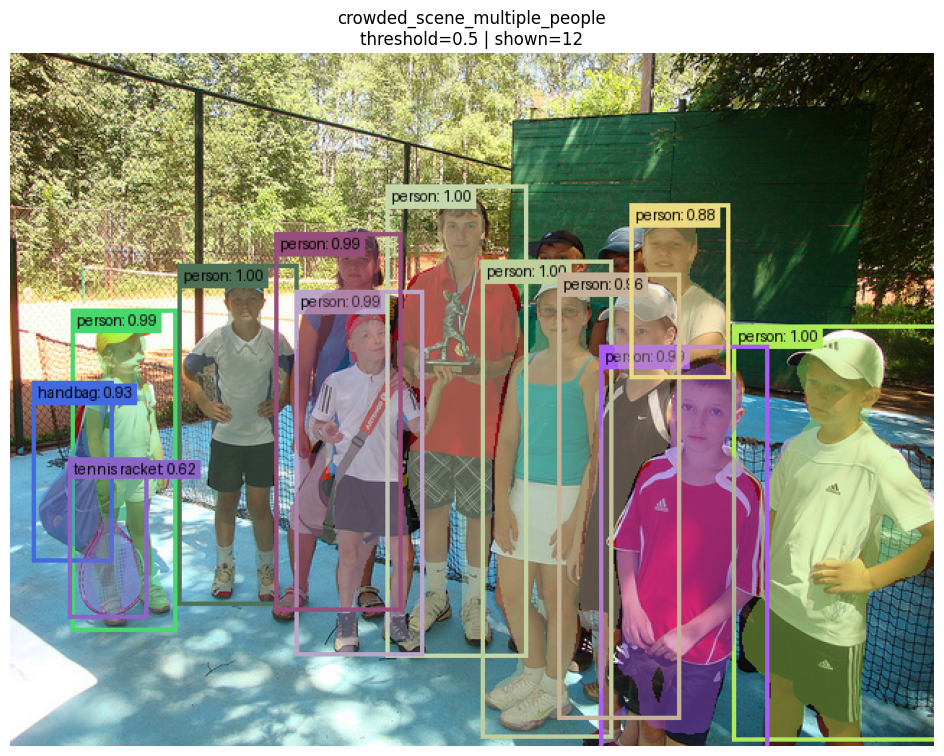


sports_scene_multiple_people | threshold = 0.5

Detections at threshold 0.5:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    1         person              1.000     [0.18000000715255737, 0.24500000476837158, 0.9409999847412109, 0.675000011920929]
1    1         person              0.930     [0.164000004529953, 0.38199999928474426, 0.8640000224113464, 0.7009999752044678]


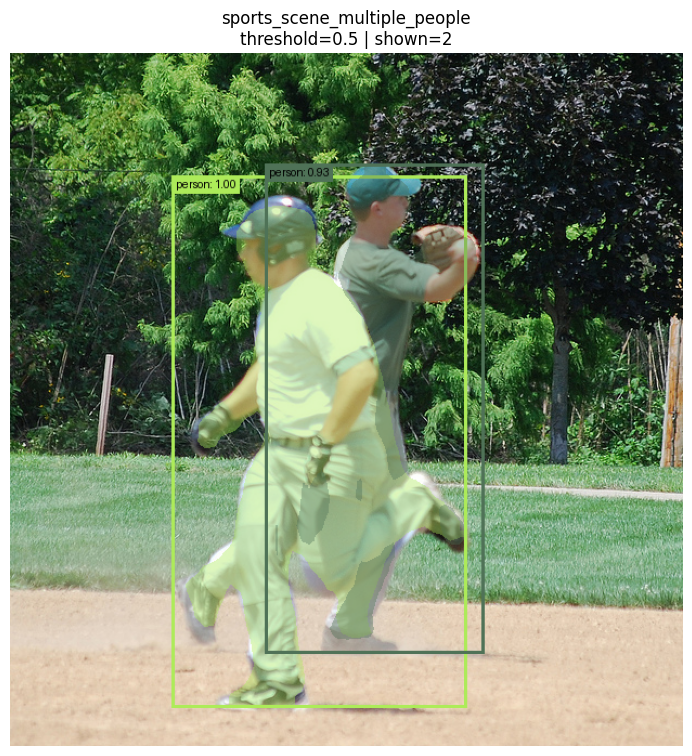


unusual_snow_scene | threshold = 0.5

Detections at threshold 0.5:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    1         person              1.000     [0.1080000028014183, 0.43700000643730164, 0.9129999876022339, 0.7739999890327454]
1    35        skis                0.992     [0.8360000252723694, 0.3199999928474426, 0.9419999718666077, 0.9570000171661377]


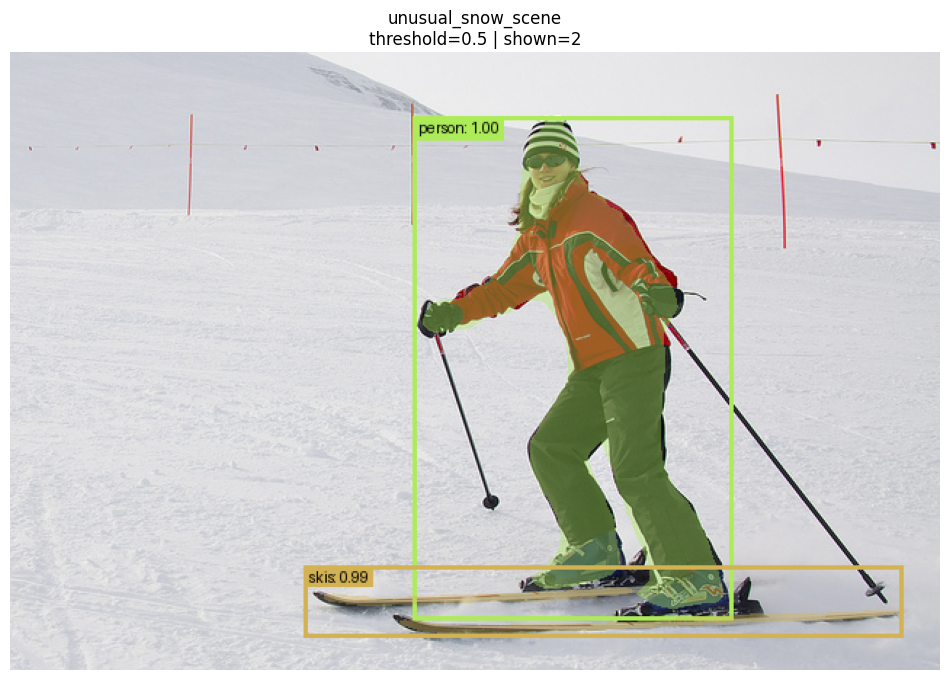


single_large_animal | threshold = 0.5

Detections at threshold 0.5:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    23        bear                1.000     [0.06800000369548798, 0.007000000216066837, 0.9779999852180481, 1.0]


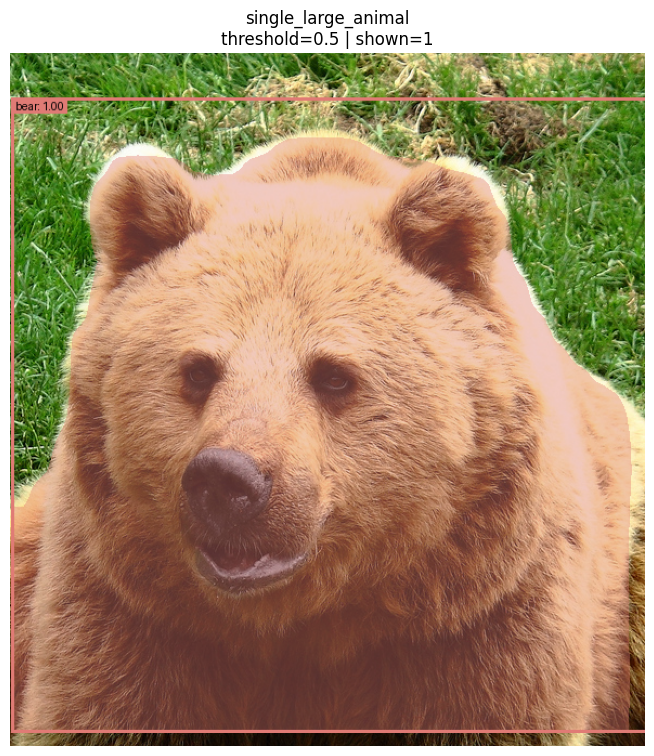


traffic_sign_scene | threshold = 0.5

Detections at threshold 0.5:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    13        stop sign           1.000     [0.1469999998807907, 0.3179999887943268, 0.45100000500679016, 0.6800000071525574]
1    8         truck               0.982     [0.5440000295639038, 0.2669999897480011, 0.6200000047683716, 0.3840000033378601]
2    15        bench               0.545     [0.621999979019165, 0.26899999380111694, 0.6620000004768372, 0.43700000643730164]


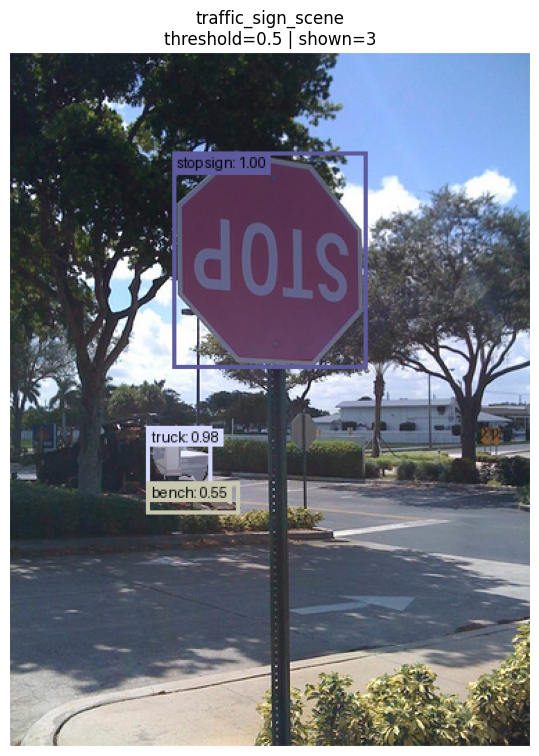

In [57]:

# =========================================================
# 7) Visualization at threshold 0.5
# =========================================================
for name, item in results.items():
    print(f"\n{name} | threshold = 0.5")
    print_detection_table(item["outputs"], threshold=0.5, max_rows=15)
    visualize_detections(
        item["image"],
        item["outputs"],
        threshold=0.5,
        max_detections=20,
        title=name
    )




crowded_scene_multiple_people | threshold = 0.3

Detections at threshold 0.3:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    1         person              0.998     [0.3970000147819519, 0.7860000133514404, 0.9890000224113464, 1.0]
1    1         person              0.996     [0.3100000023841858, 0.18400000035762787, 0.7929999828338623, 0.3089999854564667]
2    1         person              0.996     [0.19499999284744263, 0.4099999964237213, 0.8669999837875366, 0.5580000281333923]
3    1         person              0.995     [0.30399999022483826, 0.5139999985694885, 0.9850000143051147, 0.6489999890327454]
4    1         person              0.993     [0.42500001192092896, 0.640999972820282, 1.0, 0.8180000185966492]
5    1         person 

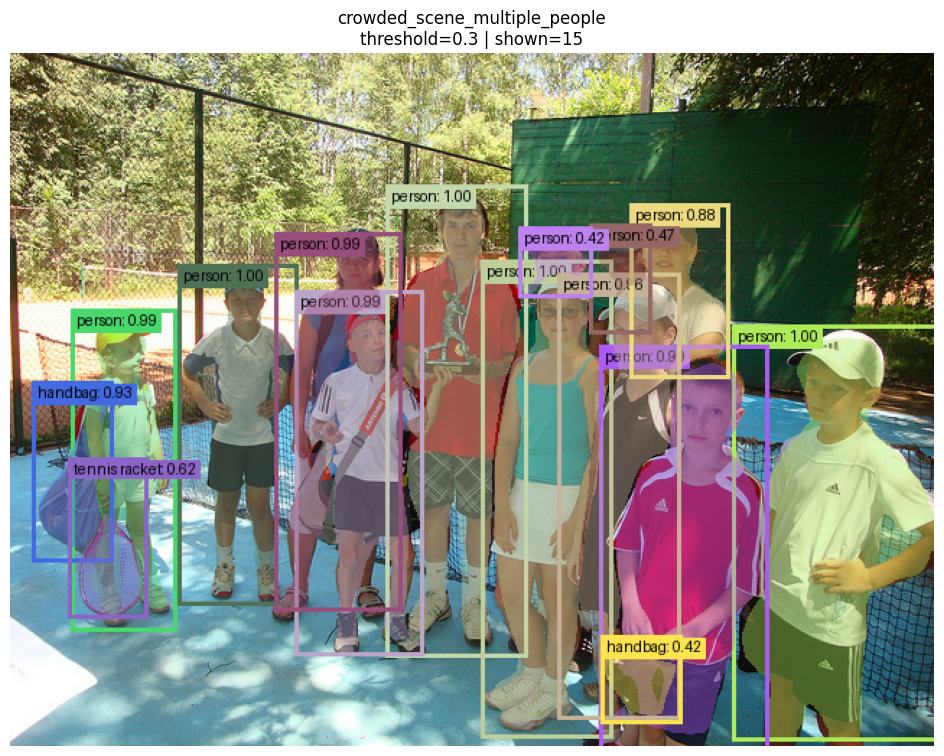


sports_scene_multiple_people | threshold = 0.3

Detections at threshold 0.3:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    1         person              1.000     [0.18000000715255737, 0.24500000476837158, 0.9409999847412109, 0.675000011920929]
1    1         person              0.930     [0.164000004529953, 0.38199999928474426, 0.8640000224113464, 0.7009999752044678]
2    1         person              0.324     [0.1720000058412552, 0.46700000762939453, 0.7350000143051147, 0.6940000057220459]


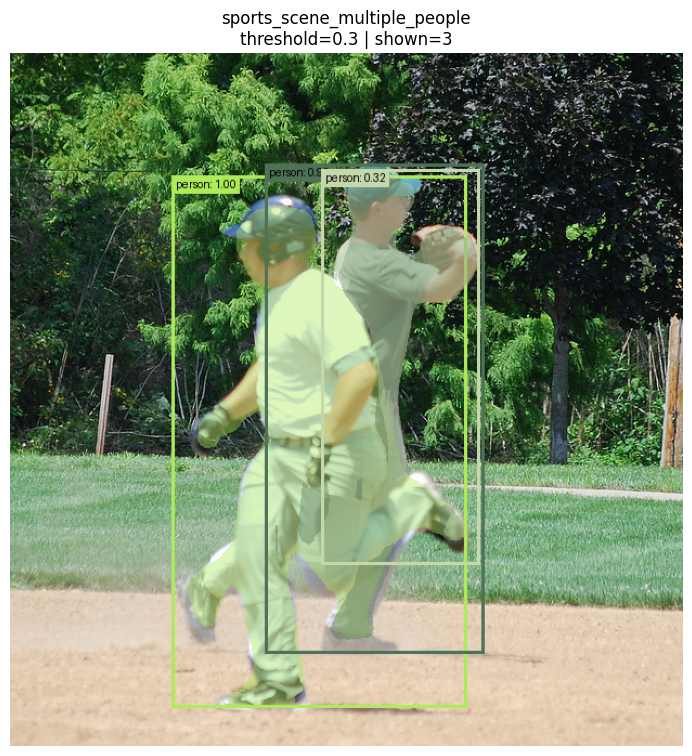


unusual_snow_scene | threshold = 0.3

Detections at threshold 0.3:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    1         person              1.000     [0.1080000028014183, 0.43700000643730164, 0.9129999876022339, 0.7739999890327454]
1    35        skis                0.992     [0.8360000252723694, 0.3199999928474426, 0.9419999718666077, 0.9570000171661377]


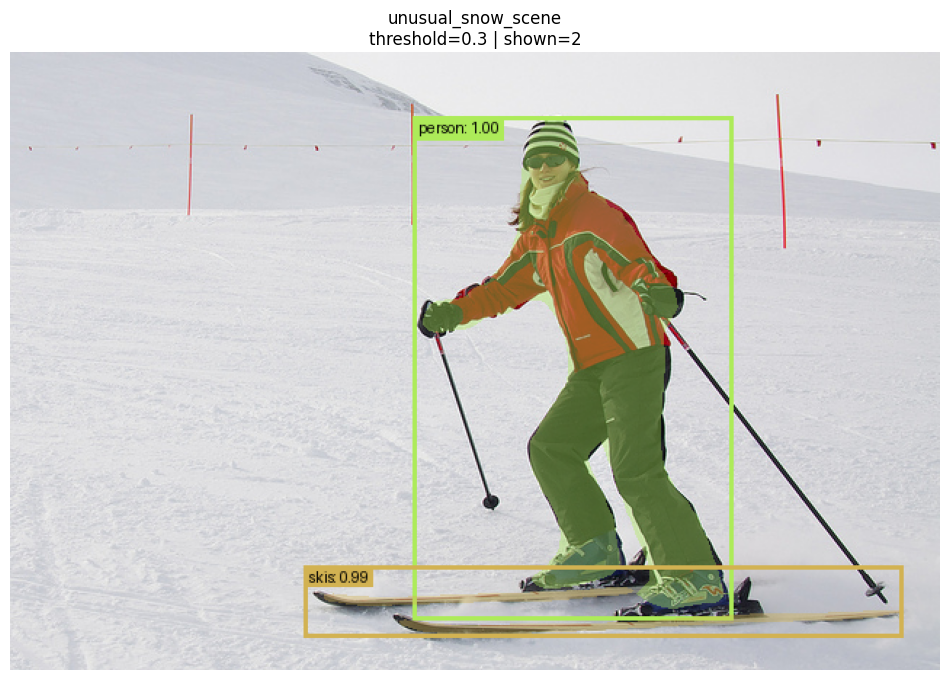


single_large_animal | threshold = 0.3

Detections at threshold 0.3:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    23        bear                1.000     [0.06800000369548798, 0.007000000216066837, 0.9779999852180481, 1.0]


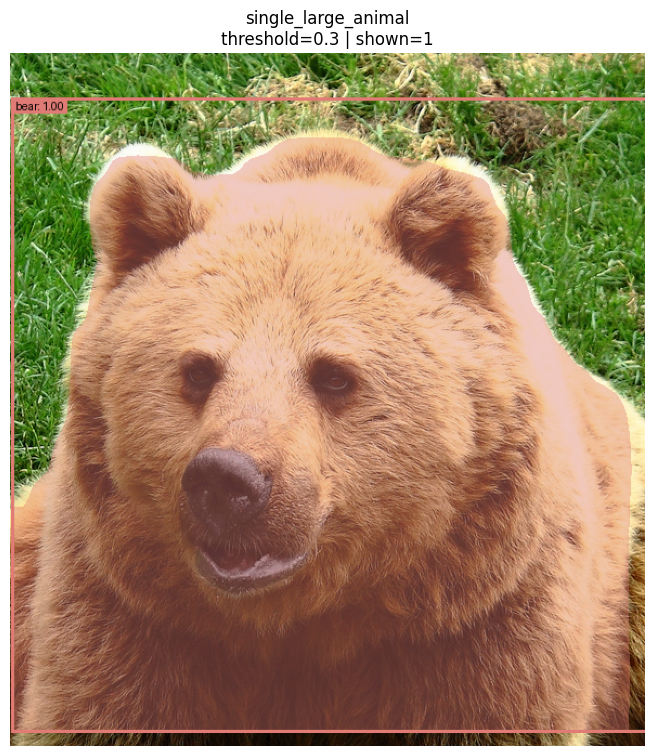


traffic_sign_scene | threshold = 0.3

Detections at threshold 0.3:
--------------------------------------------------------------------------------------------------------------
idx  class_id  label               score     box [ymin, xmin, ymax, xmax]
--------------------------------------------------------------------------------------------------------------
0    13        stop sign           1.000     [0.1469999998807907, 0.3179999887943268, 0.45100000500679016, 0.6800000071525574]
1    8         truck               0.982     [0.5440000295639038, 0.2669999897480011, 0.6200000047683716, 0.3840000033378601]
2    15        bench               0.545     [0.621999979019165, 0.26899999380111694, 0.6620000004768372, 0.43700000643730164]


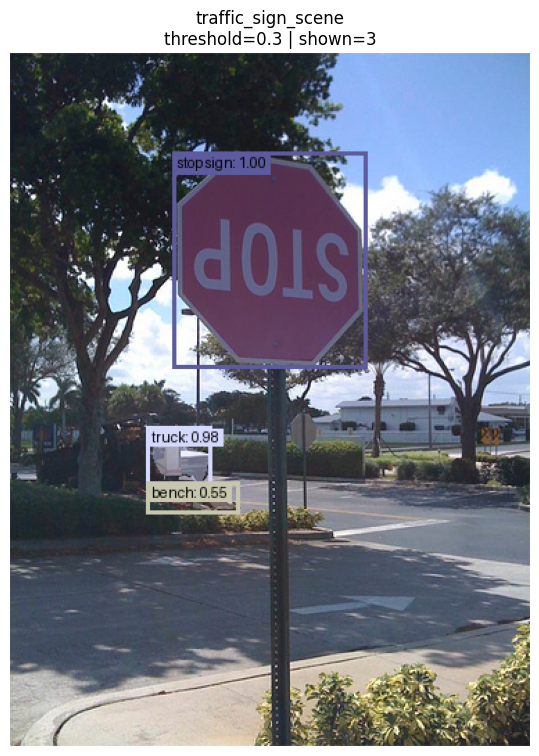

In [58]:
# =========================================================
# 8) Visualization at threshold 0.3
# =========================================================
for name, item in results.items():
    print(f"\n{name} | threshold = 0.3")
    print_detection_table(item["outputs"], threshold=0.3, max_rows=20)
    visualize_detections(
        item["image"],
        item["outputs"],
        threshold=0.3,
        max_detections=25,
        title=name
    )

In [59]:
# =========================================================
# 9) Compact comparison: count detections at both thresholds
# =========================================================
def count_detections(outputs: dict, threshold: float) -> int:
    num = get_num_detections(outputs)
    scores = outputs["detection_scores"][0][:num]
    return int(np.sum(scores >= threshold))


print(f"\n{'=' * 80}")
print("Detection count comparison")
print("-" * 50)
print(f"{'image':<30}{'@0.5':<10}{'@0.3':<10}")
print("-" * 50)

for name, item in results.items():
    c05 = count_detections(item["outputs"], 0.5)
    c03 = count_detections(item["outputs"], 0.3)
    print(f"{name:<30}{c05:<10}{c03:<10}")




Detection count comparison
--------------------------------------------------
image                         @0.5      @0.3      
--------------------------------------------------
crowded_scene_multiple_people 12        15        
sports_scene_multiple_people  2         3         
unusual_snow_scene            2         2         
single_large_animal           1         1         
traffic_sign_scene            3         3         
